In [3]:
import os
import email
import numpy as np
import pandas as pd
import seaborn as sns
import multiprocessing
import matplotlib.pyplot as plt

In [102]:
df = pd.read_csv('C:/Users/benso/Desktop/Projects/UsableAI/Project/cleaned_enron.csv')

In [103]:
import re
def split_text(text, match):	
    text = re.sub(r"\n\t", "", text)
    return re.split(match, text)

#=== create a function to extract proper text from the email body
def extract_body(text, substr):	
    result = re.split(substr, text)[-1]
    result = re.sub(r"([\n-])", "", result)
    return result

#=== clean up the data fields
#- function to extract email addresses
def extract_emails(text, substr):
    result = re.findall("[^\s]+@[\w]+.[\w]+", str(text))
    if substr not in text:
        result = ""
    return result

In [104]:
def extract_entity(text):	
    string = ""
    for i in text:
        string = string + " " + i

    list_of_emails = list(re.findall(r"@[\w]+", string))	
    result = []
    for item in list_of_emails:		
        result.append(item[1:])

    return set(result)

In [105]:
#=== store output in new column
df = df.sample(n = 30000, random_state = 0)

df["message_tidy"] = df.message.apply(lambda x : split_text(x, "\n"))

#=== take a look at the output
print(df.head())
print(df.message.head(1))
print(df.message_tidy.head(1))

        Unnamed: 0                              file  \
130167      139236           giron-d/sent_items/119.   
61498        67185    dasovich-j/all_documents/9895.   
394090      417219  shackleton-s/all_documents/4573.   
298658      316277                 mann-k/inbox/127.   
259515      275439      lenhart-m/all_documents/661.   

                                                  message  \
130167  Message-ID: <19008555.1075852228035.JavaMail.e...   
61498   Message-ID: <1401425.1075843388712.JavaMail.ev...   
394090  Message-ID: <3145416.1075844428126.JavaMail.ev...   
298658  Message-ID: <12518066.1075855244648.JavaMail.e...   
259515  Message-ID: <20339661.1075849754193.JavaMail.e...   

                       date                               subject  \
130167  07-09-2001 13:10:18                         Customer List   
61498   13-03-2001 04:10:00  Re: Fellow referred to me by Ken Lay   
394090  09-11-2000 10:09:00                 Ameriflash Newsletter   
298658  14-12-2001 0

In [106]:
#=== pull out useful data and post them into columns
df["date"] = df.message_tidy.apply(lambda x : x[1])
df["X-From"] = df.message_tidy.apply(lambda x : x[2])
df["X-To"] = df.message_tidy.apply(lambda x : x[3])
df["subject"] = df.message_tidy.apply(lambda x : x[4])
#emails_df["cc"] = emails_df.message_tidy.apply(lambda x : x[5])
#emails_df["bcc"] = emails_df.message_tidy.apply(lambda x : x[9])
df["body"] = df.message.apply(lambda x : extract_body(x, r"X-FileName: [\w]*[\s]*[(Non\-Privileged).pst]*[\w-]*[.nsf]*").strip())

In [107]:
#extract sender and sendee emails

df.loc[:,"X-From"] = df.loc[:,"X-From"].apply(lambda x : extract_emails(x, "From: "))
df.loc[:,"X-To"] = df.loc[:,"X-To"].apply(lambda x : extract_emails(x, "To: "))

In [108]:
df["sender_entity"] = df.loc[:,"X-From"].apply(lambda x : extract_entity(x))
df["recipient_entity_to"] = df.loc[:,"X-To"].apply(lambda x : extract_entity(x))

In [109]:
df["sender_entity"] = df.sender_entity.apply(lambda x : list(x))

In [110]:
def extract_subject(text):

    list_of_words = re.split("\s", text)
    words_to_drop = ["Subject:","re:","Re:","RE:","fw:","Fw:", "FW:"]

    desired_words = []
    for word in list_of_words:
        if word not in words_to_drop:
            desired_words.append(word)

    r = re.compile("[\w]{3,}")
    final_list = list(filter(r.match, desired_words))

    return final_list 



df.loc[:,"subject"] = df.loc[:,"subject"].apply(lambda x : extract_subject(x))

In [111]:
df.rename(columns={'X-From': 'From', 'X-To': 'To'}, inplace=True)


In [112]:
newdf = df.loc[:,["date","subject","body","From", "To","sender_entity","recipient_entity_to"]]

print(newdf.head())

                                               date  \
130167   Date: Fri, 7 Sep 2001 13:10:18 -0700 (PDT)   
61498   Date: Tue, 13 Mar 2001 04:10:00 -0800 (PST)   
394090   Date: Thu, 9 Nov 2000 10:09:00 -0800 (PST)   
298658  Date: Fri, 14 Dec 2001 07:23:06 -0800 (PST)   
259515  Date: Mon, 19 Mar 2001 05:48:00 -0800 (PST)   

                             subject  \
130167              [Customer, List]   
61498   [Fellow, referred, Ken, Lay]   
394090      [Ameriflash, Newsletter]   
298658  [Project, Questions-Florida]   
259515                            []   

                                                     body  \
130167         Here it is.  Let me know what you think.DG   
61498   Steve:Based on the note from Rosalee, and if y...   
394090  BUSINESS HIGHLIGHTSTRANSACTION DEVELOPMENTTran...   
298658  Well, that is exactly what I am doing right no...   
259515  not this weekend but the following weekend.  y...   

                                   From                      

In [113]:
#=== function to expand list into multiple rows
#- we examine just the "sender_email" and "all_recipient_emails"
#- we try to break up the list (in "all_recipient_emails") into multiple rows
from itertools import chain
def investigate(df_col1, df_col2):
    result_df = pd.DataFrame({ "send" : np.repeat(df_col1.values, df_col2.str.len()),"receive": list(chain.from_iterable(df_col2))})
    result_df.send = result_df.send.apply(lambda x : x[0])
    return result_df

df2a = investigate(newdf.From,newdf.To)
df2b = investigate(newdf.sender_entity,newdf.recipient_entity_to)
#df2c = investigate(newdf.From,newdf.recipient_entity_to)

#df2a = investigate(df.sender_email, df.all_recipient_emails)
#df2b = investigate(df.sender_entity, df.all_recipient_entities)

In [117]:
sendees = pd.DataFrame(df2a['receive'].value_counts())
sendees.reset_index(inplace=True)


sendees.columns = ['Sendees', 'count']
# top 20 folders
topsendee = sendees.iloc[:1,:]
print(topsendee)
newnewdf = df2a.loc[df2a['receive'] == 'richard.shapiro@enron.com']
print(newnewdf)

                     Sendees  count
0  richard.shapiro@enron.com    912
                             send                    receive
24      harry.kingerski@enron.com  richard.shapiro@enron.com
34          john.llodra@enron.com  richard.shapiro@enron.com
68          luiz.maurer@enron.com  richard.shapiro@enron.com
279         margo.reyna@enron.com  richard.shapiro@enron.com
338       jeff.dasovich@enron.com  richard.shapiro@enron.com
...                           ...                        ...
193817     paul.kaufman@enron.com  richard.shapiro@enron.com
193968    miyung.buster@enron.com  richard.shapiro@enron.com
194048    miyung.buster@enron.com  richard.shapiro@enron.com
194219       john.shelk@enron.com  richard.shapiro@enron.com
194834    jeff.dasovich@enron.com  richard.shapiro@enron.com

[912 rows x 2 columns]


In [142]:
#Kenneth LAy
#kenneth.lay@enron.com

kenneth_lay = df2a.loc[df2a['send'] == 'kenneth.lay@enron.com']
#print(kenneth_lay)

G_ken = nx.from_pandas_edgelist(kenneth_lay, 'send', 'receive')

plt.figure(figsize=(20,20))
pos = nx.spring_layout(G_ken, k=.1)
nx.draw_networkx(G_ken, pos, node_size=100, node_color='red', with_labels=True, edge_color='blue')
plt.title("Top Receiver: Richard Sharpiro Network")
plt.savefig("C:/Users/benso/Desktop/Projects/UsableAI/Project/KennethLayNetwork.png")
plt.show()

                         send                    receive
26248   kenneth.lay@enron.com      sarah.davis@enron.com
96403   kenneth.lay@enron.com    michelle.cash@enron.com
125811  kenneth.lay@enron.com      erica.adams@enron.com
125812  kenneth.lay@enron.com     john.addison@enron.com
125813  kenneth.lay@enron.com     matthew.almy@enron.com
...                       ...                        ...
126752  kenneth.lay@enron.com       sally.beck@enron.com
126753  kenneth.lay@enron.com        s..pollan@enron.com
126754  kenneth.lay@enron.com   teresa.mandola@enron.com
126755  kenneth.lay@enron.com  tosha.henderson@enron.com
126756  kenneth.lay@enron.com     tracey.irvin@enron.com

[948 rows x 2 columns]


In [145]:
#####Let's look for sketchy buzzwords

Debt=newdf[(newdf['body'].str.contains('debt'))] 
print(Debt.count())

Bankrupt=newdf[(newdf['body'].str.contains('bankrupt'))] 
print(Bankrupt.count())


"""
arthur_df = newdf.loc[newdf['body'].str.contains('Arthur Andersen')]
#print(arthur_df)

df2c = investigate(arthur_df.From,arthur_df.To)
"""

date                   401
subject                401
body                   401
From                   401
To                     401
sender_entity          401
recipient_entity_to    401
dtype: int64
date                   466
subject                466
body                   466
From                   466
To                     466
sender_entity          466
recipient_entity_to    466
dtype: int64


"\narthur_df = newdf.loc[newdf['body'].str.contains('Arthur Andersen')]\n#print(arthur_df)\n\ndf2c = investigate(arthur_df.From,arthur_df.To)\n"

In [119]:
#Arthur_Andersen=newdf[(newdf['body'].str.contains('Arthur Andersen'))] 
#Arthur_Andersen.count()

#arthur anderson shows up 30 times!!!
Arthur_Andersen=newdf[(newdf['body'].str.contains('Arthur Andersen'))] 
print(Arthur_Andersen.count())

arthur_df = newdf.loc[newdf['body'].str.contains('Arthur Andersen')]
#print(arthur_df)

df2c = investigate(arthur_df.From,arthur_df.To)


date                   48
subject                48
body                   48
From                   48
To                     48
sender_entity          48
recipient_entity_to    48
dtype: int64


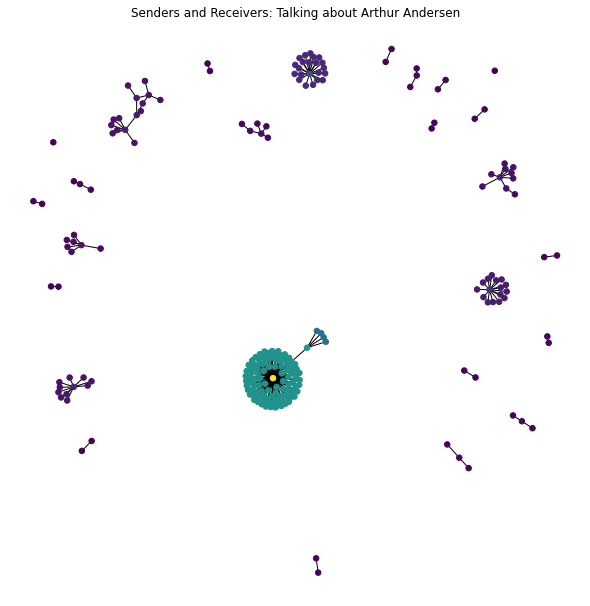

In [141]:
#nx.draw(G4, node_size = 50, node_color = closeness_G4, edge_color = 'black', with_labels = False)


Gand = nx.from_pandas_edgelist(df2c, 'send', 'receive')

closeness_Gand = nx.closeness_centrality(Gand)
closeness_Gand = list(closeness_Gand.values())

plt.figure(figsize=(8,8))
#pos = nx.spring_layout(Gand, k=.1)
nx.draw(Gand, node_size=30, node_color=closeness_Gand, with_labels=False, edge_color='black')
plt.title("Senders and Receivers: Talking about Arthur Andersen")
plt.savefig("C:/Users/benso/Desktop/Projects/UsableAI/Project/AndersenNetwork.png")
plt.show()

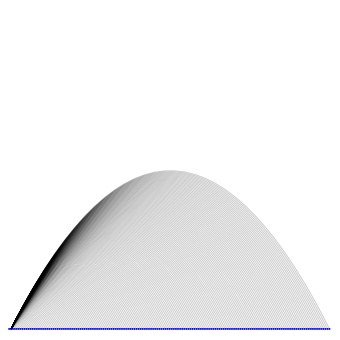

In [127]:
import nxviz as nv
G = nx.from_pandas_edgelist(newnewdf, 'send', 'receive')
plot = nv.ArcPlot(G)
plot.draw()
plt.show() 


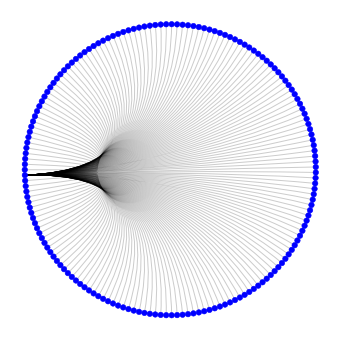

In [128]:
plot = nv.CircosPlot(G)
plot.draw()
plt.show()

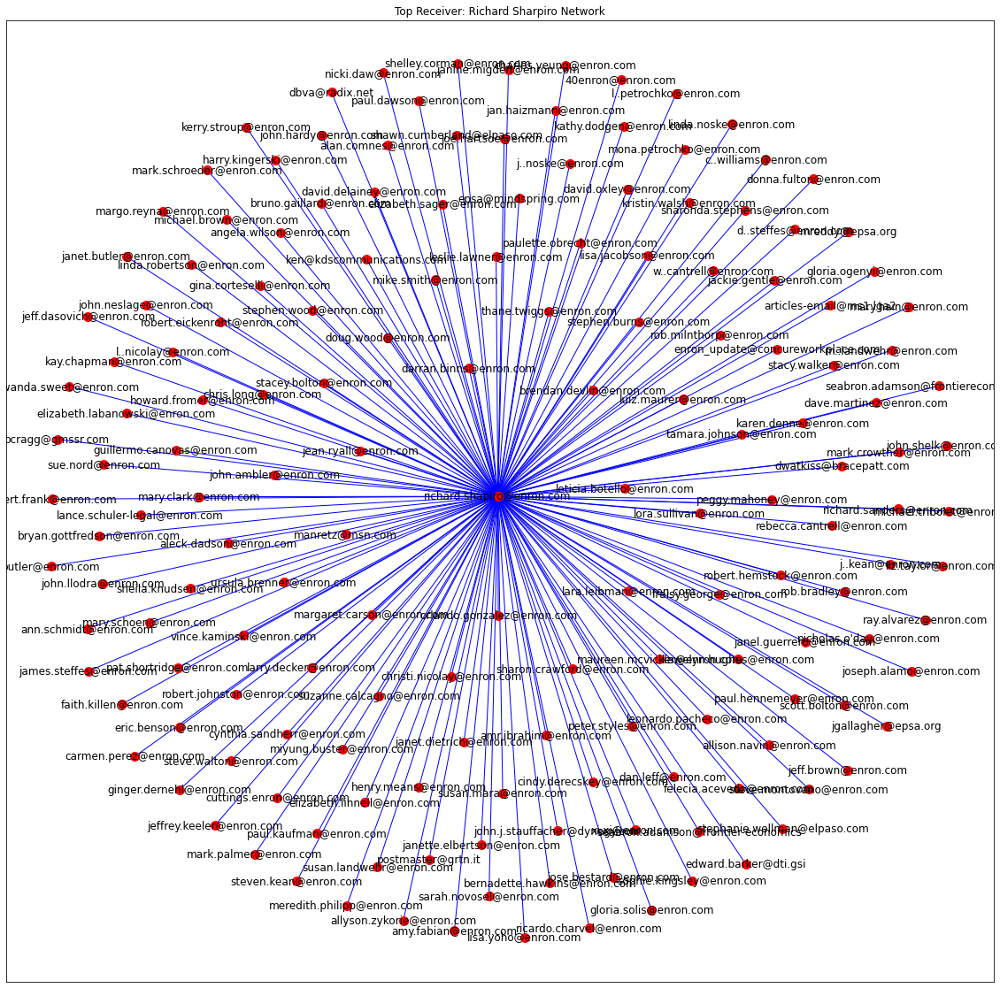

In [130]:
plt.figure(figsize=(20,20))
pos = nx.spring_layout(G, k=.1)
nx.draw_networkx(G, pos, node_size=100, node_color='red', with_labels=True, edge_color='blue')
plt.title("Top Receiver: Richard Sharpiro Network")
plt.savefig("C:/Users/benso/Desktop/Projects/UsableAI/Project/RichardShapiroNetwork.png")
plt.show()

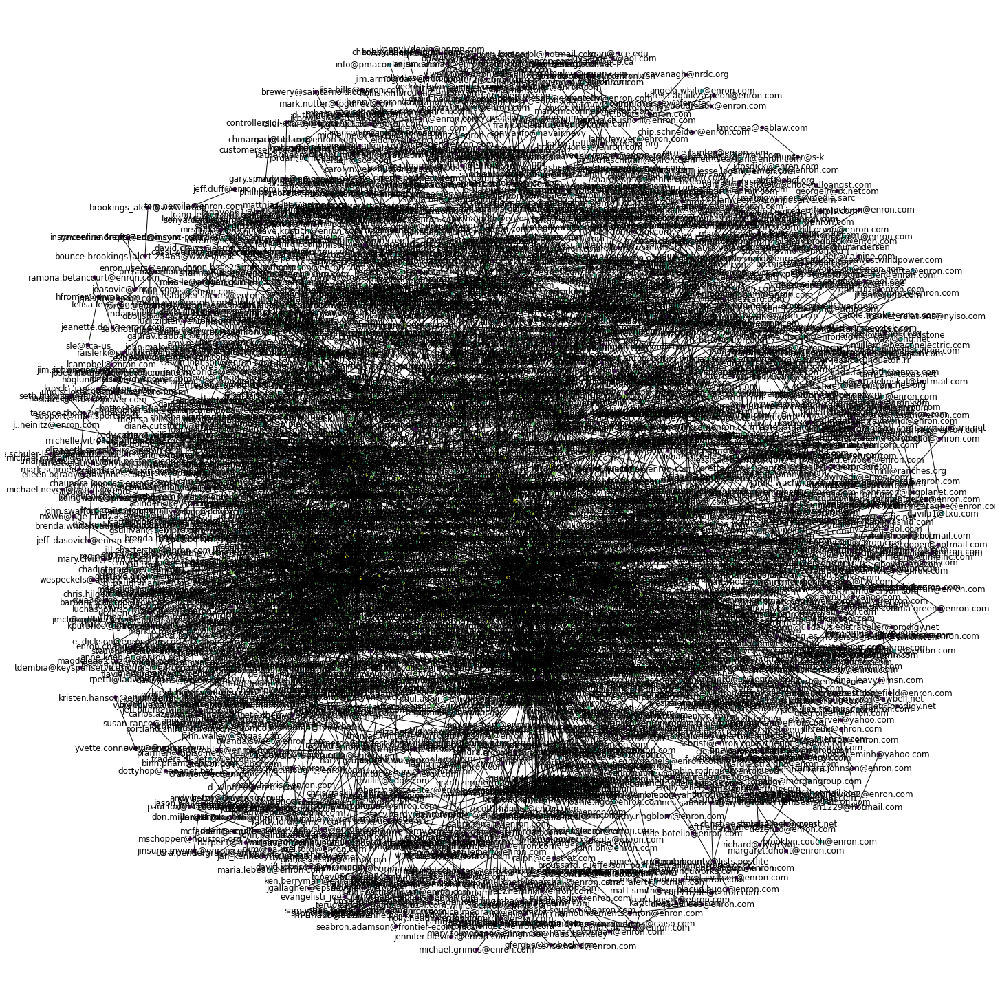

In [16]:
import networkx as nx
import matplotlib.pyplot as plt



#=== for the sender and recipient emails
#- define the graph

#newdf = df.loc[:,["date","subject","body","From", "To","sender_entity","recipient_entity_to"]]
#df2a = newdf.loc[:,["From","To"]]

#df
G1 = nx.from_pandas_edgelist(df2a.sample(round(0.1*len(df2a)), random_state = 0), "send", "receive")

#- we define the closeness measure
closeness_G1 = nx.closeness_centrality(G1)
closeness_G1 = list(closeness_G1.values())

#- plot the network
plt.figure(figsize = (20,20))
pos1 = nx.spring_layout(G1, k=.1)
nx.draw(G1, pos1, node_size = 20, node_color = closeness_G1, with_labels = True)
plt.savefig("C:/Users/benso/Desktop/Projects/UsableAI/Project/network5000.png")
plt.show()


In [ ]:
#What if I just want to look at ONE of these senders? 

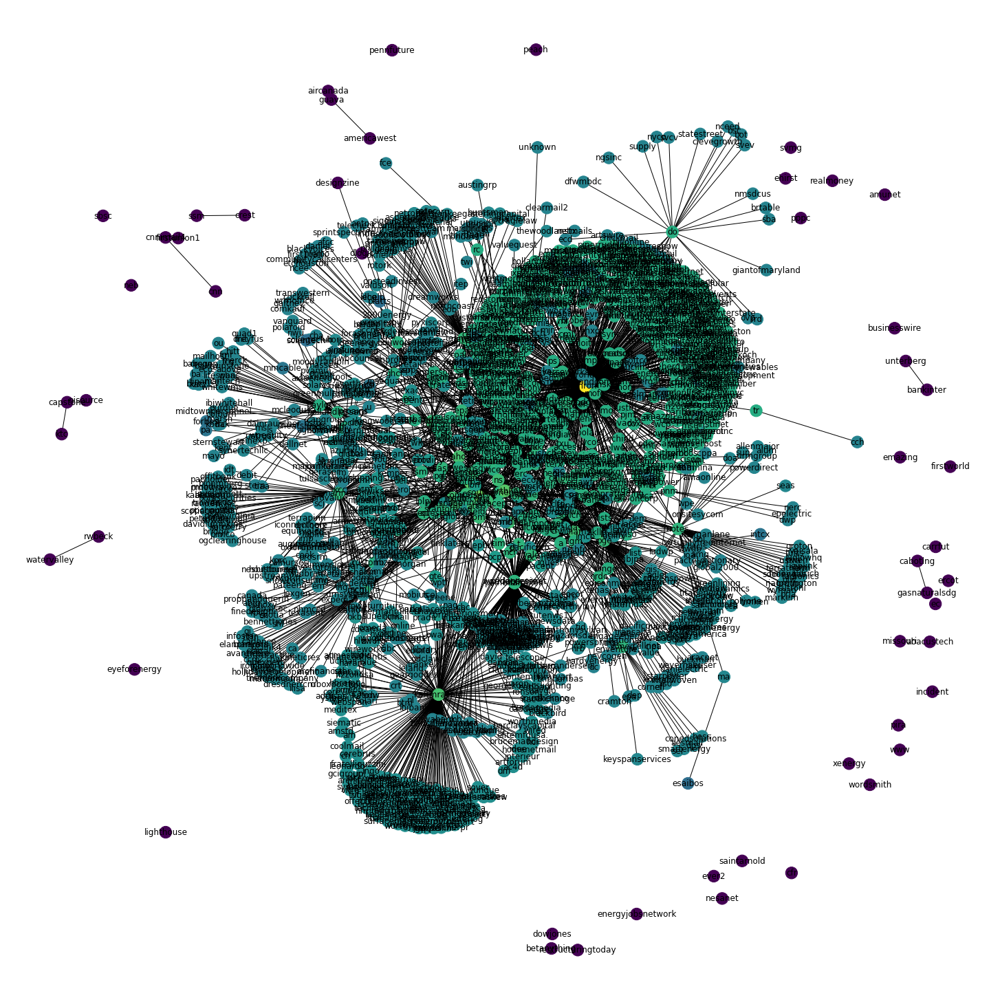

In [111]:

#newdf = df.loc[:,["date","subject","body","From", "To","sender_entity","recipient_entity_to"]]
#df2b = newdf.loc[:,["send","receive"]]

G2 = nx.from_pandas_edgelist(df2b, "send", "receive")

#- we define the closeness measure
closeness_G2 = nx.closeness_centrality(G2)
closeness_G2 = list(closeness_G2.values())

#- plot the network
plt.figure(figsize = (20,20))
pos2 = nx.spring_layout(G2, k=.1)
nx.draw(G2, pos2, node_size = 300, node_color = closeness_G2,with_labels = True)
plt.savefig("C:/Users/benso/Desktop/Projects/UsableAI/Project/network_entities5000.png")
plt.show()


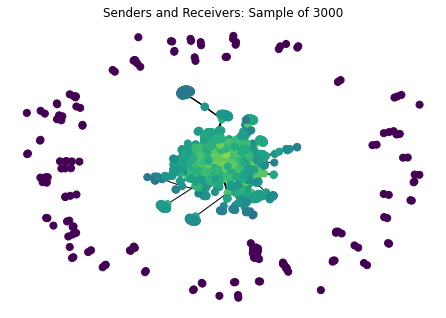

In [135]:
import networkx as nx
EMAIL_NUMBER = 300000
data_s = df.head(EMAIL_NUMBER)
G4 = nx.from_pandas_edgelist(df2a.head(5000), 'send', 'receive')

closeness_G4 = nx.closeness_centrality(G4)
closeness_G4 = list(closeness_G4.values())

#G4 = nx.from_pandas_edgelist(df2a.head(3000), 'send', 'receive')
nx.draw(G4, node_size = 50, node_color = closeness_G4, edge_color = 'black', with_labels = False)
plt.title("Senders and Receivers: Sample of 3000")
plt.savefig("C:/Users/benso/Desktop/Projects/UsableAI/Project/senders_receivers_3000.png")
plt.show()


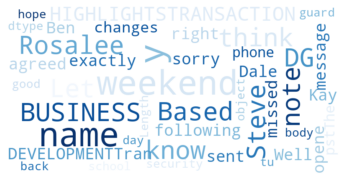

In [32]:
import wordcloud
from wordcloud import WordCloud, STOPWORDS


wordcloud = WordCloud(background_color="white", scale=2,colormap='Blues', max_font_size=40).generate(str(newdf['body']))
plt.imshow(wordcloud, cmap=plt.cm.gray, interpolation="bilinear")
plt.axis('off')
plt.savefig("C:/Users/benso/Desktop/Projects/UsableAI/Project/body_wordcloud.png")